# Ejercicio 4: Mapas de Coropletas de la Encuesta CASEN 2013

Eduardo Graells-Garrido (egraells@udd.cl), Diego Caro (dcaro@udd.cl).

En este ejercicio definiremos una función para visualizar datos geoespaciales utilizando *mapas de coropletas*. Esta técnica de visualización en inglés se llama [Choropleth Map](https://en.wikipedia.org/wiki/Choropleth_map), y es utilizada comúnmente para mostrar distribuciones de datos en mapas, adjudicando uno o más valores dentro de una escala a cada área del mapa. 

Como este tipo de visualización colorea cada área del mapa de acuerdo a su valor dentro de una distribución específica, es posible encontrar patrones geográficos. 

Los ejemplos más comunes son los mapas electorales y mapas de distribución de ingreso (o similares). Aquí hay un ejemplo de un mapa de coropletas por áreas censales de Santiago, mostrando la distribución de grupos socioeconómicos:

![](img/03_choropleth_stgo.jpg)

Ahora bien, hay que tener cuidado cuando se elaboran estos mapas porque debemos asegurarnos que las variables a analizar en distintas áreas sean relativas. Por ejemplo, no es lo mismo comparar cantidad de votos totales por un candidato en comunas, sino que deben compararse los porcentajes. Estas problemáticas las trabajaremos a lo largo del curso :)

## Bibliotecas y Configuración

Como siempre, lo primero que haremos será cargar todas las herramientas necesarias para ejecutar este notebook.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

from carpynter import choropleth

sns.set(context='poster', style='ticks', palette='Accent', font_scale=1.1)
%matplotlib inline

## Comunas de Santiago

Queremos visualizar datos geoespaciales, y por ende lo primero que necesitamos es cargar la geografía. Para ello cargaremos los bordes comunales de acuerdo al _shapefile_ de comunas que dispone la Biblioteca Nacional del Congreso. Lo cargaremos usando GeoPandas:

In [2]:
municipalities = gpd.read_file('./input/shapefile_comunas/division_comunal.shp', crs={'init': 'epsg:5361'})
municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry
0,Región de La Araucanía,Malleco,Ercilla,170675.595438,48,14,9204,170675.595706,4.979025e+08,"POLYGON ((190393.2198999999 5794527.3661, 1904..."
1,Región de La Araucanía,Malleco,Lonquimay,346907.195437,49,14,9205,346907.195899,3.932854e+09,"POLYGON ((294265.5926999999 5781748.8701, 2943..."
2,Región de La Araucanía,Malleco,Los Sauces,169844.122286,48,14,9206,169844.122239,8.519730e+08,"POLYGON ((155495.1031999998 5804765.8096, 1555..."
3,Región de La Araucanía,Malleco,Lumaco,227705.219204,48,14,9207,227705.218806,1.112643e+09,"POLYGON ((159561.5301000001 5778741.6606, 1597..."
4,Región de La Araucanía,Malleco,Purén,137030.480474,48,14,9208,137030.480353,4.654760e+08,"POLYGON ((145272.5931000002 5804247.7066, 1453..."


In [5]:
#municipalities.plot()

Recordemos que el sistema de coordenadas que utiliza este archivo está en metros, no en latitud/longitud. Esto permite realizar operaciones como estimar el área de cada comuna:

In [6]:
municipalities['area_km2'] = municipalities.area / 1000000

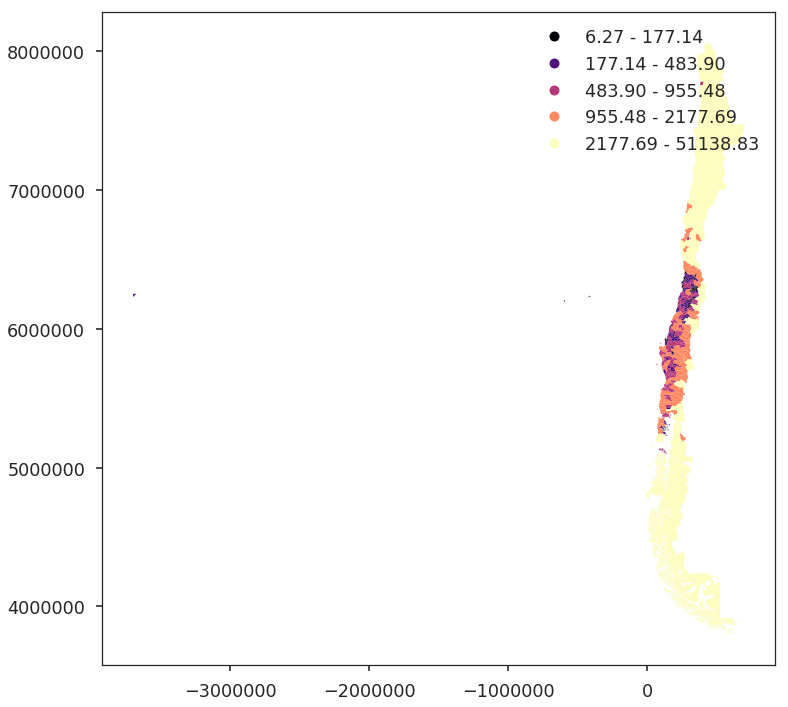

In [8]:
municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

In [9]:
metropolitan_region = municipalities[municipalities.NOM_REG == 'Región Metropolitana de Santiago']
metropolitan_region.shape

(52, 11)

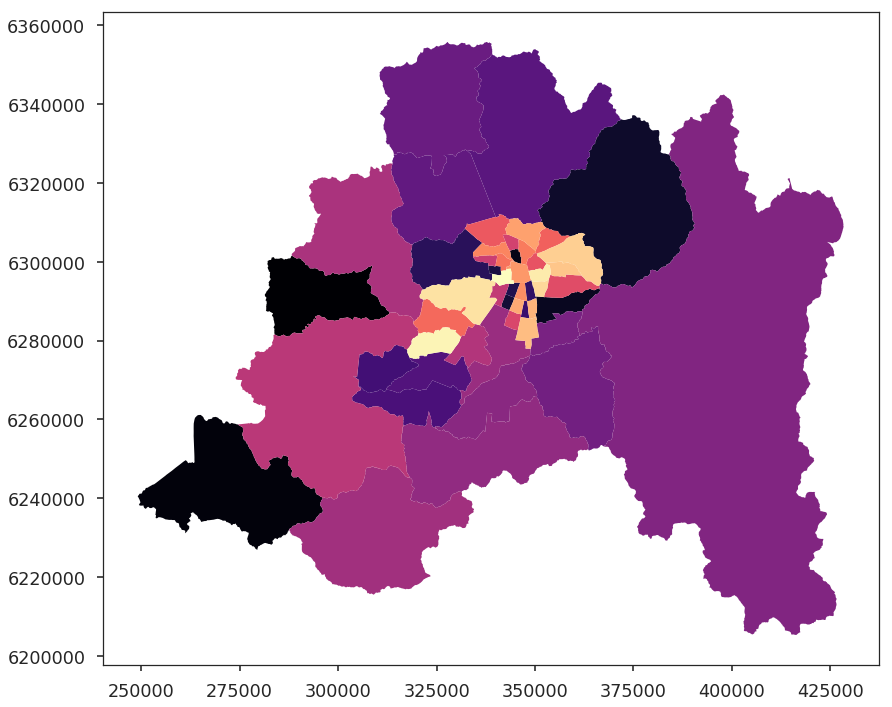

In [17]:
metropolitan_region.plot(figsize=(20,12), cmap='magma', legend=True)

## Urban Areas

In [12]:
urban_areas = gpd.read_file('./input/urban_areas/', crs={'init': 'epsg:5361'})
urban_areas.sample(5)

,NOMBRE,TIPO_AREA,SHAPE_Leng,SHAPE_Area,geometry
354,Alcones,Aldea,3911.559435,2.494180e+05,"POLYGON ((248506.6190999998 6191329.5877, 2488..."
158,Corte Alto,Pueblo,4647.059313,6.791156e+05,"POLYGON ((149460.7478 5457879.5795, 149429.517..."
388,Puerto Cisnes,Pueblo,6276.744864,8.013494e+05,"POLYGON ((208089.5816000002 5041072.5323, 2082..."
4,Concepción,Ciudad,82986.894378,3.454227e+07,"POLYGON ((133504.8541999999 5919782.2124, 1360..."
322,Panimavida,Pueblo,4164.702142,6.673409e+05,"POLYGON ((280816.3929000003 6039420.4197, 2810..."


In [13]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].shape

(1, 5)

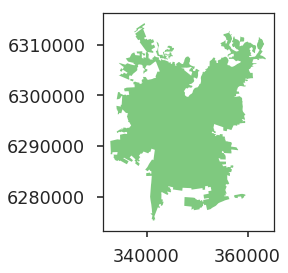

In [14]:
urban_areas[urban_areas.NOMBRE == 'Santiago'].plot()

In [15]:
stgo_area = urban_areas[urban_areas.NOMBRE == 'Santiago'].geometry
stgo_area

385    (POLYGON ((338445.2911 6306151.2221, 338289.25...
Name: geometry, dtype: object

This is not the idiomatic way of doing it, but using geopandas' overlays has lower quality (and unstructured) results.

In [18]:
metropolitan_region['geometry'] = metropolitan_region.geometry.map(lambda x: x.intersection(stgo_area[385]))
urban_municipalities = metropolitan_region[metropolitan_region.area > 0].copy()
urban_municipalities['area_km2'] = urban_municipalities.area / 1000000

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


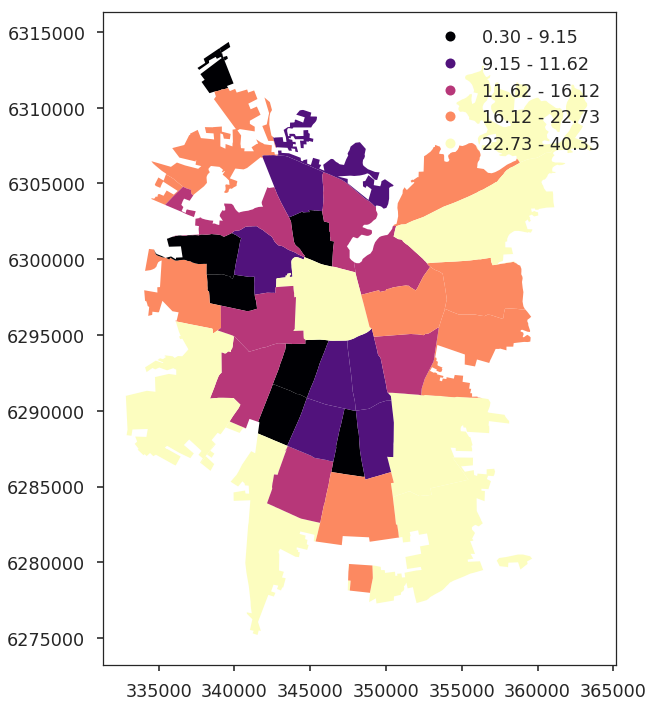

In [19]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

In [20]:
urban_municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry,area_km2
177,Región Metropolitana de Santiago,Santiago,Independencia,11488.695747,19,7,1310,11718.687086,7.514746e+06,"POLYGON ((345884.0031000003 6302609.6842, 3458...",7.514746
178,Región Metropolitana de Santiago,Santiago,La Florida,49696.426793,26,8,1311,49621.402175,7.103733e+07,"POLYGON ((355737.3829907289 6286882.946599475,...",33.765370
179,Región Metropolitana de Santiago,Santiago,Lo Barnechea,149539.074262,23,8,1311,149865.511039,1.024735e+09,"(POLYGON ((362193.352993806 6307218.971546588,...",24.297415
180,Región Metropolitana de Santiago,Santiago,Lo Espejo,11405.976039,28,8,1311,11389.045242,8.181655e+06,"POLYGON ((342637.7674000002 6291726.7842, 3427...",8.135703
181,Región Metropolitana de Santiago,Santiago,Lo Prado,10795.433316,18,7,1311,10691.672491,6.535088e+06,"POLYGON ((341488.7580000004 6296729.4443, 3414...",6.535088


In [21]:
urban_municipalities = urban_municipalities.to_crs({'init': 'epsg:4326'})

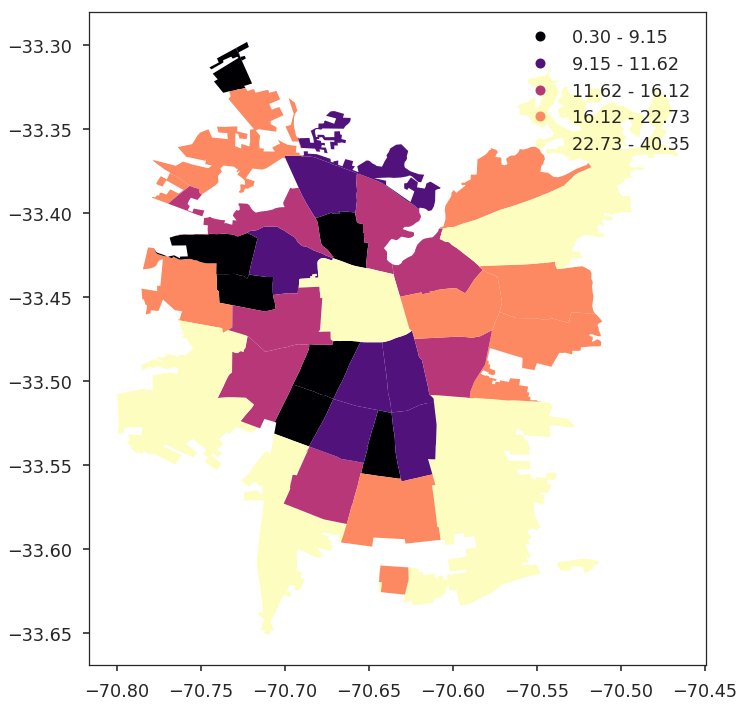

In [22]:
urban_municipalities.plot(figsize=(20,12), column='area_km2', scheme='quantiles', cmap='magma', legend=True)

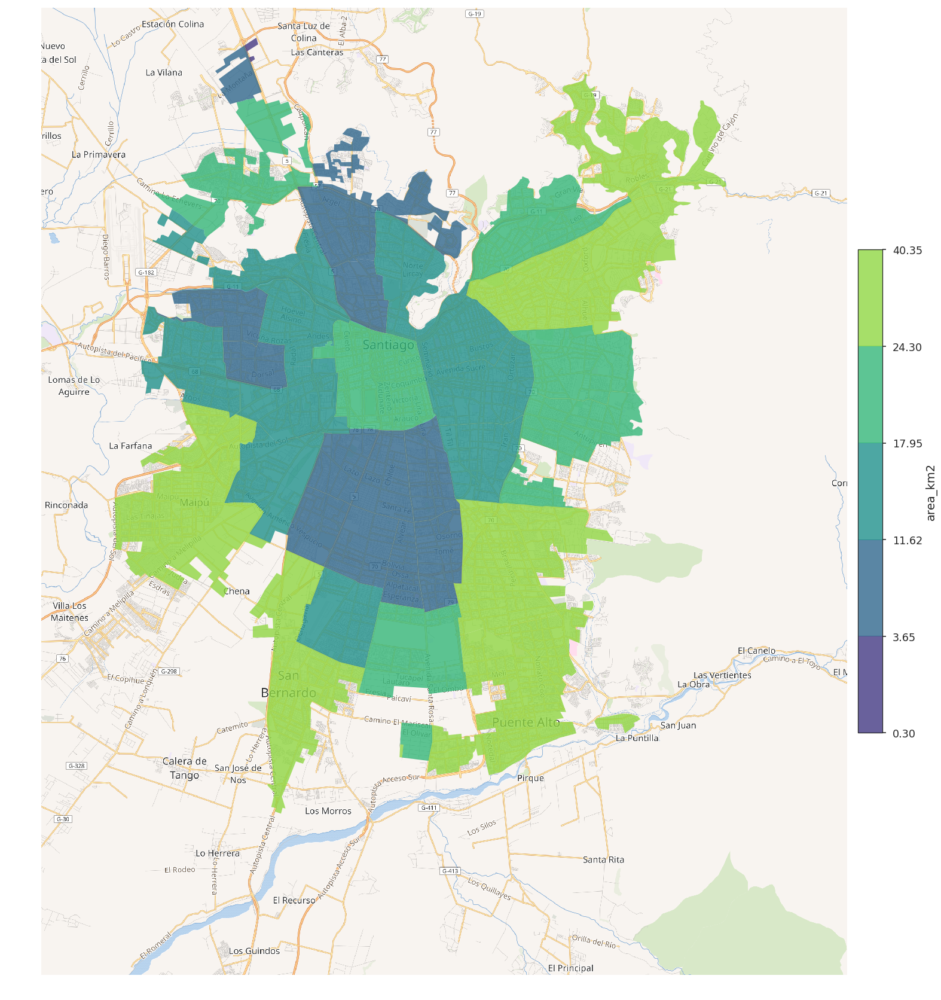

In [29]:
choropleth(urban_municipalities, column='area_km2', scheme='fisher_jenks', palette='viridis', figsize=28, alpha=0.8)

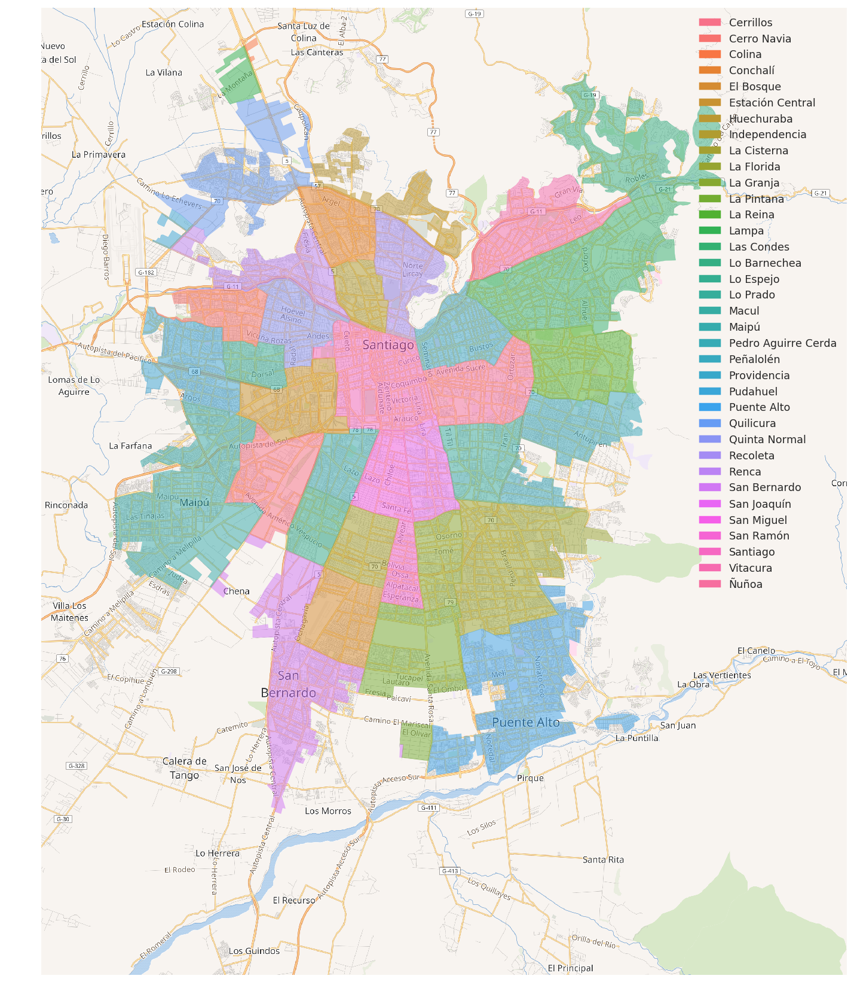

In [30]:
choropleth(urban_municipalities, column='NOM_COM', scheme='categorical', palette='husl', figsize=28, alpha=0.5)

## CASEN Survey 2013

In [31]:
casen = pd.read_csv('./input/2013_casen_survey/Casen2013.csv.gz', sep=',', encoding='iso-8859-1')
casen.sample(3)

/home/egraells/.virtualenvs/jupyter/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (16,18,25,27,38,51,114,234,286,312,316,332,349,360,369) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,folio,o,region,comuna,zona,pco1,sexo,edad,ecivil,...,esc,educ,depen,activ,indmat,indsan,calgobviv,iai,iae,hacinamiento
41377,41377,5.109105e+10,3,5,5109,1,3,1,5,7,...,NaN,0,4.0,NaN,1,1,1,1,1,1
49888,49888,5.603101e+10,4,5,5603,1,3,2,14,7,...,NaN,2,2.0,NaN,1,1,1,1,1,1
117878,117878,8.416101e+10,1,8,8416,1,1,1,52,1,...,12.0,5,NaN,1.0,1,1,1,2,1,1


In [33]:
list(casen.columns)

['Unnamed: 0',
 'folio',
 'o',
 'region',
 'comuna',
 'zona',
 'pco1',
 'sexo',
 'edad',
 'ecivil',
 'h5l',
 'h5h',
 'pareja',
 'nucleo',
 'pco2',
 'h8',
 'h8esp',
 'h9',
 'h9esp',
 'e1',
 'e2a',
 'e2b',
 'e2c',
 'e3',
 'e4',
 'e4esp',
 'e5',
 'e5esp',
 'e6a',
 'e6b',
 'e6c',
 'e6d',
 'e7',
 'e8nom',
 'e8dir',
 'e8com',
 'e8com_cod',
 'e8rbd',
 'e8dv',
 'e8depen',
 'e8te',
 'e9',
 'e10',
 'e11a',
 'e11b',
 'e11c',
 'e11d',
 'e11e',
 'e12a',
 'e12b1',
 'e12b2',
 'e12esp',
 'e13pbu',
 'e13pbt',
 'e13pbd',
 'e13pbm',
 'e13bu',
 'e13bt',
 'e13bd',
 'e13bm',
 'e13bpc',
 'e13mu',
 'e13mt',
 'e13md',
 'e13mm',
 'e14a',
 'e14b',
 'e15',
 'e16',
 'e17t1',
 'e18m1',
 'e18p1',
 'e17t2',
 'e18m2',
 'e18p2',
 'e0',
 'o1',
 'o2',
 'o3',
 'o4',
 'o5',
 'o6',
 'o7r1',
 'o7r2',
 'o8',
 'o9a',
 'oficio4',
 'oficio1',
 'o9b',
 'o10',
 'o11',
 'o12',
 'o13',
 'o14',
 'o15',
 'o16',
 'o17',
 'o18',
 'o19',
 'o20',
 'o21',
 'rama4_sub',
 'rama1_sub',
 'o22',
 'o23',
 'rama4',
 'rama1',
 'o24',
 'o25',
 'o26

In [34]:
name_map = dict(zip([13101, 13102, 13103
    ,13104,13105,13106,13107,13108,13109,13110,13111,13112,13113,13114,13115,13116,13117,13118,13119,13120,13121,13122,13123
    ,13124,13125,13126,13127,13128,13129,13130,13131,13132,13201,13202,13203,13301,13302,13303,13401,13402,13403,13404,13501,
    13502, 13503, 13504, 13505, 13601, 13602, 13603, 13604, 13605],
    map(lambda x: x.title(), ['Santiago', 'Cerrillos', 'Cerro Navia', 'Conchalí', 'El Bosque', 'Estación Central', 'Huechuraba', 'Independencia', 'La Cisterna', 'La Florida', 'La Granja', 'La Pintana', 'La Reina', 'Las Condes', 'Lo Barnechea', 
                          'Lo Espejo', 'Lo Prado', 'Macul', 'Maipú', 'Ñuñoa', 'Pedro Aguirre Cerda', 'Peñalolén', 'Providencia', 
                          'Pudahuel', 'Quilicura', 'Quinta Normal', 'Recoleta', 'Renca', 'San Joaquín', 'San Miguel',
                          'San Ramón', 'Vitacura', 'Puente Alto', 'Pirque', 'San José de Maipo', 'Colina',
                          'Lampa', 'Tiltil', 'San Bernardo', 'Buin', 'Calera de Tango', 'Paine',
                          'Melipilla', 'Alhué', 'Curacaví', 'María Pinto', 'San Pedro', 'Talagante',
                          'El Monte', 'Isla de Maipo', 'Padre Hurtado', 'Peñaflor'
])))
name_map

{13101: 'Santiago',
 13102: 'Cerrillos',
 13103: 'Cerro Navia',
 13104: 'Conchalí',
 13105: 'El Bosque',
 13106: 'Estación Central',
 13107: 'Huechuraba',
 13108: 'Independencia',
 13109: 'La Cisterna',
 13110: 'La Florida',
 13111: 'La Granja',
 13112: 'La Pintana',
 13113: 'La Reina',
 13114: 'Las Condes',
 13115: 'Lo Barnechea',
 13116: 'Lo Espejo',
 13117: 'Lo Prado',
 13118: 'Macul',
 13119: 'Maipú',
 13120: 'Ñuñoa',
 13121: 'Pedro Aguirre Cerda',
 13122: 'Peñalolén',
 13123: 'Providencia',
 13124: 'Pudahuel',
 13125: 'Quilicura',
 13126: 'Quinta Normal',
 13127: 'Recoleta',
 13128: 'Renca',
 13129: 'San Joaquín',
 13130: 'San Miguel',
 13131: 'San Ramón',
 13132: 'Vitacura',
 13201: 'Puente Alto',
 13202: 'Pirque',
 13203: 'San José De Maipo',
 13301: 'Colina',
 13302: 'Lampa',
 13303: 'Tiltil',
 13401: 'San Bernardo',
 13402: 'Buin',
 13403: 'Calera De Tango',
 13404: 'Paine',
 13501: 'Melipilla',
 13502: 'Alhué',
 13503: 'Curacaví',
 13504: 'María Pinto',
 13505: 'San Pedro',
 

In [35]:
casen.shape

(218491, 601)

In [36]:
# solamente RM
casen = casen[casen.region == 13].copy()
casen.shape

(36680, 601)

In [37]:
# recuperamos el nombre de acuerdo al diccionario
casen['municipality'] = casen['comuna'].map(lambda x: name_map[x])
casen['municipality'].value_counts()

Maipú                  2968
Puente Alto            2882
La Florida             1729
San Bernardo           1476
Peñalolén              1398
Pudahuel               1251
Las Condes             1163
La Pintana             1105
Santiago                961
Quilicura               945
Cerro Navia             900
Recoleta                894
El Bosque               885
La Granja               878
Providencia             850
Renca                   816
Conchalí                794
Ñuñoa                   785
Estación Central        772
Macul                   675
Lo Prado                642
Pedro Aguirre Cerda     640
Quinta Normal           603
Melipilla               555
San Ramón               543
Talagante               504
Peñaflor                486
Vitacura                485
Lo Espejo               485
San Joaquín             476
Lo Barnechea            469
Lampa                   454
Huechuraba              449
Cerrillos               448
Independencia           439
La Cisterna         

In [39]:
casen['r20'].describe()

count    14467.000000
mean         8.382526
std          9.278511
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         99.000000
Name: r20, dtype: float64

In [40]:
# dejamos a quienes respondieron la pregunta que nos interesa (r20) y que están en las comunas urbanas, mayores de 18
casen = casen[(casen.municipality.isin(urban_municipalities.NOM_COM)) 
              & (casen.r20 <= 10)
              & (casen.edad >= 18)].copy()
casen.shape

(12197, 602)

In [41]:
casen['r20'].describe()

count    12197.000000
mean         7.468804
std          2.180284
min          1.000000
25%          6.000000
50%          8.000000
75%         10.000000
max         10.000000
Name: r20, dtype: float64

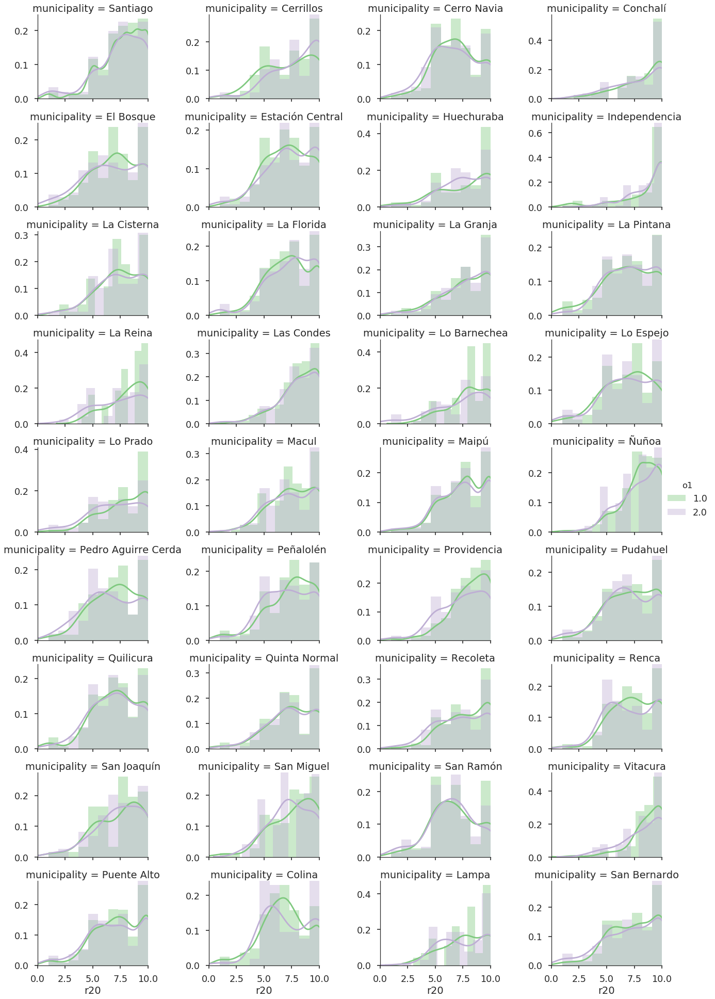

In [42]:
g = sns.FacetGrid(data=casen, col='municipality', hue='o1', col_wrap=4, aspect=1.5, size=3, sharey=False)
g.map(sns.distplot, 'r20', bins=10)
g.set(xlim=[0,10])
g.add_legend()

In [46]:
casen.loc[:,('r20', 'expr_r20', 'expr')].head()

,r20,expr_r20,expr
161379,9.0,3232.0,2111
161380,5.0,5422.0,2111
161381,5.0,NaN,2111
161382,10.0,3594.0,2111
161383,10.0,3594.0,2111


In [47]:
casen['adjusted_r20'] = casen.r20 * casen.expr_r20
casen_municipality_exp = casen.groupby('municipality').aggregate({'expr_r20': 'sum'})
casen_municipality_exp.head()

,expr_r20
municipality,
Cerrillos,82869.0
Cerro Navia,107214.0
Colina,55916.0
Conchalí,84330.0
El Bosque,123270.0


In [48]:
satisfaction = casen.groupby('municipality').aggregate({'r20': 'sum', 'adjusted_r20': 'sum'}).join(casen_municipality_exp)
satisfaction.head()

,adjusted_r20,r20,expr_r20
municipality,,,
Cerrillos,641107.0,1352.0,82869.0
Cerro Navia,751386.0,2277.0,107214.0
Colina,428153.0,1049.0,55916.0
Conchalí,676105.0,2354.0,84330.0
El Bosque,882563.0,2114.0,123270.0


In [49]:
satisfaction['exp_average'] = satisfaction['adjusted_r20'] / satisfaction['expr_r20']
satisfaction.head()

,adjusted_r20,r20,expr_r20,exp_average
municipality,,,,
Cerrillos,641107.0,1352.0,82869.0,7.736391
Cerro Navia,751386.0,2277.0,107214.0,7.008283
Colina,428153.0,1049.0,55916.0,7.657075
Conchalí,676105.0,2354.0,84330.0,8.017372
El Bosque,882563.0,2114.0,123270.0,7.159593


In [50]:
urban_satisfaction = satisfaction.loc[urban_municipalities.NOM_COM].copy()
urban_satisfaction.head()

,adjusted_r20,r20,expr_r20,exp_average
municipality,,,,
Independencia,633056.0,1364.0,73181.0,8.650551
La Florida,2333759.0,4768.0,303903.0,7.679289
Lo Barnechea,385704.0,1182.0,45978.0,8.388882
Lo Espejo,695617.0,1335.0,91623.0,7.592166
Lo Prado,532041.0,1668.0,67234.0,7.913273


In [51]:
urban_municipalities['life_satisfaction'] = urban_municipalities['NOM_COM'].map(lambda x: urban_satisfaction.loc[x].exp_average)
urban_municipalities.head()

,NOM_REG,NOM_PROV,NOM_COM,SHAPE_LENG,DIS_ELEC,CIR_SENA,COD_COMUNA,SHAPE_Le_1,SHAPE_Area,geometry,area_km2,life_satisfaction
177,Región Metropolitana de Santiago,Santiago,Independencia,11488.695747,19,7,1310,11718.687086,7.514746e+06,POLYGON ((-70.6573023154117 -33.40478555612682...,7.514746,8.650551
178,Región Metropolitana de Santiago,Santiago,La Florida,49696.426793,26,8,1311,49621.402175,7.103733e+07,POLYGON ((-70.55390783885275 -33.5479534813209...,33.765370,7.679289
179,Región Metropolitana de Santiago,Santiago,Lo Barnechea,149539.074262,23,8,1311,149865.511039,1.024735e+09,(POLYGON ((-70.48126702168348 -33.365443103374...,24.297415,8.388882
180,Región Metropolitana de Santiago,Santiago,Lo Espejo,11405.976039,28,8,1311,11389.045242,8.181655e+06,POLYGON ((-70.69410527396822 -33.5024321434231...,8.135703,7.592166
181,Región Metropolitana de Santiago,Santiago,Lo Prado,10795.433316,18,7,1311,10691.672491,6.535088e+06,POLYGON ((-70.70558600981737 -33.4571600757547...,6.535088,7.913273


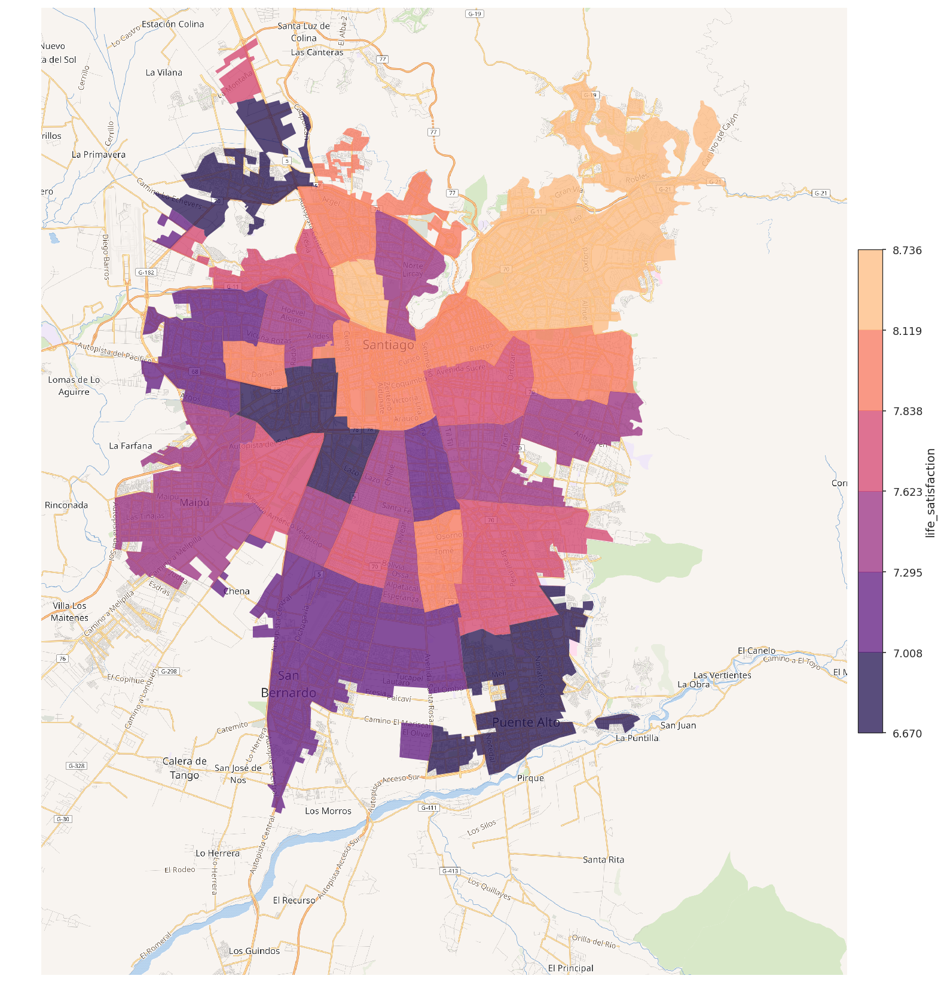

In [52]:
choropleth(urban_municipalities, figsize=28, column='life_satisfaction', palette='magma', n_colors=6)

Los promedios son todos "altos". De hecho, gracias a eso se dice que gran parte de los chilenos [está satisfecho con su vida](http://www.plataformaurbana.cl/archive/2015/02/28/encuesta-casen-en-dos-anos-suben-de-63-a-70-los-chilenos-que-estan-felices-con-su-vida/). Sin embargo, Chile también es un país con [preocupantes índices de depresión](http://www.elmostrador.cl/agenda-pais/vida-en-linea/2017/02/23/chile-se-ubica-por-sobre-el-promedio-mundial-en-indice-de-depresion-segun-nuevo-informe-de-la-oms/). Entonces, ¿cómo interpretar estos números?

Proponemos que la manera correcta de hacerlo es ver los índices de satisfacción de manera relativa. Lo que importa no es si alguien dice 7 de 10, sino qué tan arriba o abajo del promedio alguien dice estar satisfecho. Para ello utilizaremos la fórmula de puntaje estándar o $z-score$:

$$z(x) = \frac{x - \mu(x)}{\sigma(x)}$$ 

El puntaje estándar nos dice qué tanto se aleja del promedio un valor, en términos de la desviación estándar del dataset. Lo podemos calcular así:

In [53]:
urban_satisfaction['z_satisfaction'] = ((urban_satisfaction['exp_average'] - urban_satisfaction['exp_average'].mean()) /
                                        urban_satisfaction['exp_average'].std())
urban_satisfaction['z_satisfaction'].sample(5)

municipality
Quinta Normal    0.002873
Quilicura       -1.462601
San Bernardo    -0.708198
San Joaquín     -0.995307
Cerro Navia     -1.294927
Name: z_satisfaction, dtype: float64

In [79]:
urban_satisfaction.z_satisfaction.sort_values()

municipality
Pedro Aguirre Cerda   -2.009788
Puente Alto           -1.647607
Quilicura             -1.462601
Estación Central      -1.318391
Cerro Navia           -1.294927
San Joaquín           -0.995307
El Bosque             -0.974755
Pudahuel              -0.742382
La Pintana            -0.722348
San Bernardo          -0.708198
San Ramón             -0.688044
Maipú                 -0.358027
Macul                 -0.322171
San Miguel            -0.125511
Peñalolén             -0.107283
Lo Espejo             -0.059432
Recoleta              -0.042873
Quinta Normal          0.002873
Lampa                  0.005509
Colina                 0.077915
La Florida             0.124920
La Cisterna            0.157127
Renca                  0.175976
Cerrillos              0.245748
Ñuñoa                  0.349988
Santiago               0.460975
Lo Prado               0.620029
La Granja              0.692755
Providencia            0.728081
La Reina               0.827819
Conchalí               0.84

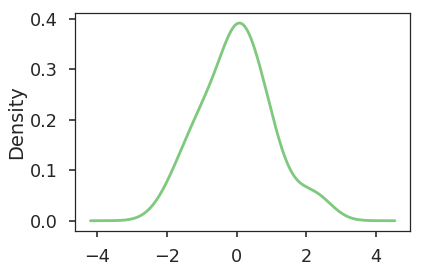

In [54]:
urban_municipalities['z_satisfaction'] = urban_municipalities.NOM_COM.map(lambda x: urban_satisfaction.loc[x].z_satisfaction)
urban_municipalities['z_satisfaction'].plot(kind='density')

Como resultado, observamos que tenemos personas con valores negativos (bajo el promedio) y positivos (sobre el promedio).

Esto permite usar una escala de colores que permite _ver_ mejor esas diferencias:

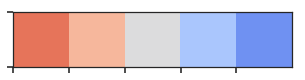

In [56]:
sns.palplot(sns.color_palette('coolwarm_r', n_colors=5))

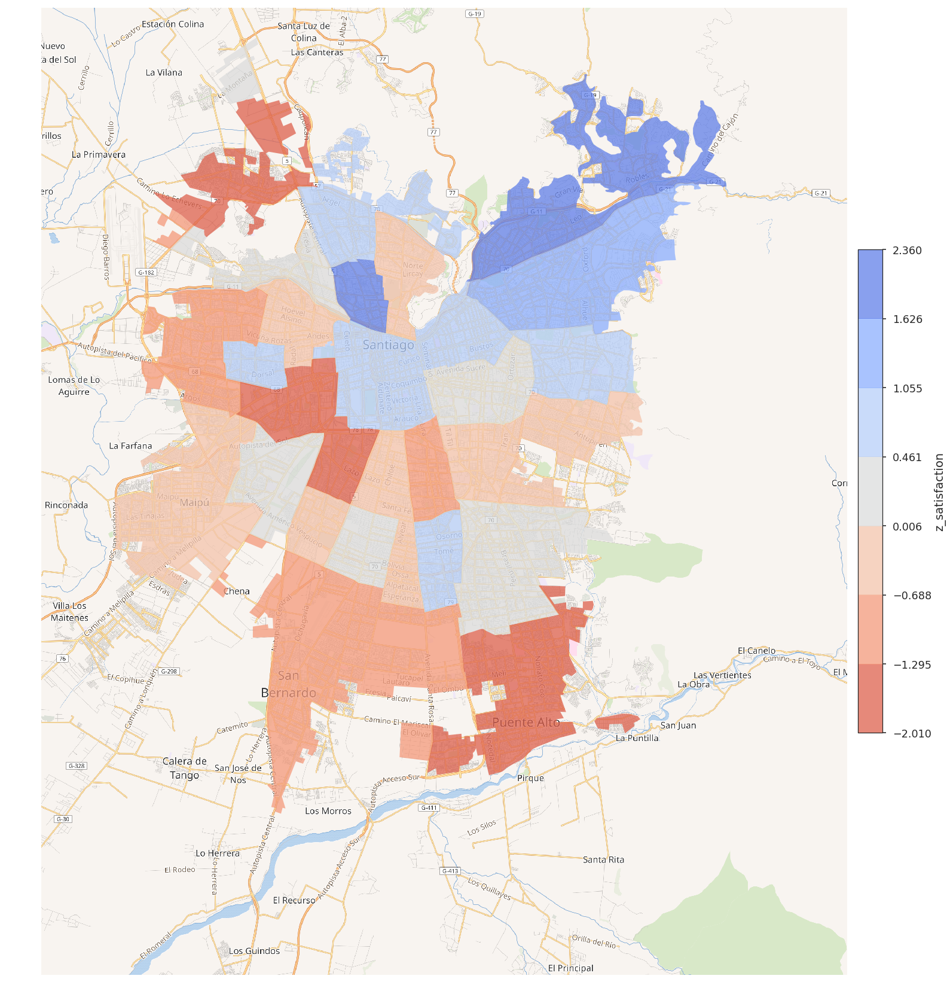

In [58]:
choropleth(urban_municipalities, figsize=28,  column='z_satisfaction', palette='coolwarm_r', n_colors=7)

Parece haber una correlación clara con el nivel de ingreso. Veamos esta variable en la CASEN:

In [61]:
casen.ytotcorh.describe()

count    1.219700e+04
mean     1.105801e+06
std      1.354931e+06
min      0.000000e+00
25%      4.614330e+05
50%      7.312500e+05
75%      1.213333e+06
max      4.390000e+07
Name: ytotcorh, dtype: float64

Debemos hacer el mismo cálculo de expansión que hicimos para la satisfacción:

In [62]:
casen['adjusted_income'] = casen.ytotcorh * casen.expr
casen_municipality_income_exp = casen.groupby('municipality').aggregate({'expr': 'sum'})
income = casen.groupby('municipality').aggregate({'ytotcorh': 'sum', 'adjusted_income': 'sum'}).join(casen_municipality_income_exp)
income.head()

,adjusted_income,ytotcorh,expr
municipality,,,
Cerrillos,32595963674,147957764,37881
Cerro Navia,35731363402,228692320,52692
Colina,23280728406,102461713,29484
Conchalí,32270349912,208278030,46507
El Bosque,48034382914,219680291,61559


In [63]:
income['exp_income'] = income['adjusted_income'] / income['expr']

In [65]:
income.sort_values(by='exp_income')

,adjusted_income,ytotcorh,expr,exp_income
municipality,,,,
Recoleta,40094996439,230003060,64705,6.196584e+05
La Granja,33460339394,196694788,53238,6.285048e+05
Independencia,26766762473,121557039,42431,6.308303e+05
La Pintana,48357627646,261661249,72623,6.658721e+05
Cerro Navia,35731363402,228692320,52692,6.781174e+05
San Bernardo,75248660440,463364406,109020,6.902280e+05
Pudahuel,66630286928,343362031,96532,6.902404e+05
Conchalí,32270349912,208278030,46507,6.938816e+05
San Ramón,22530312713,151050915,30106,7.483662e+05


In [66]:
urban_municipalities['income'] = urban_municipalities.NOM_COM.map(lambda x: income.loc[x].exp_income)

In [67]:
urban_municipalities.loc[:,('NOM_COM', 'income')].sort_values(by='income')

,NOM_COM,income
302,Recoleta,6.196584e+05
308,La Granja,6.285048e+05
177,Independencia,6.308303e+05
309,La Pintana,6.658721e+05
292,Cerro Navia,6.781174e+05
226,San Bernardo,6.902280e+05
183,Pudahuel,6.902404e+05
293,Conchalí,6.938816e+05
185,San Ramón,7.483662e+05
181,Lo Prado,7.526195e+05


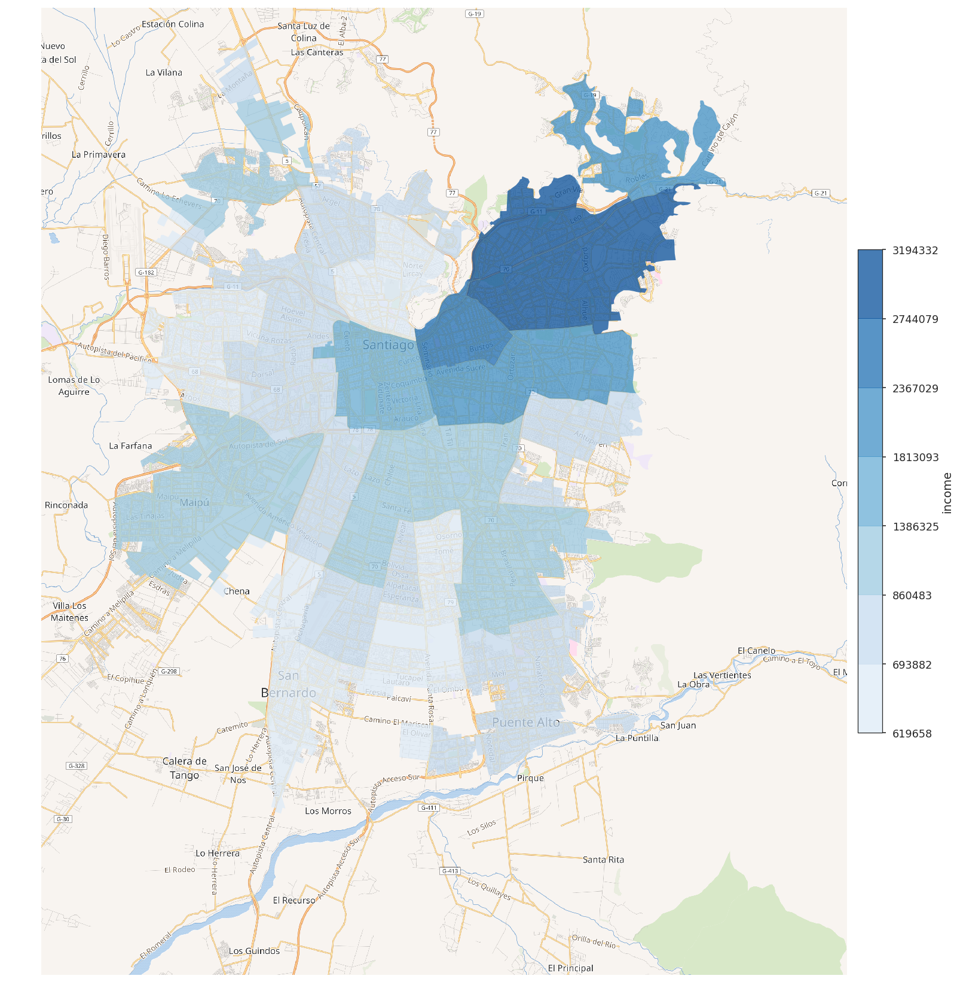

In [72]:
choropleth(urban_municipalities, figsize=28, column='income', scheme='fisher_jenks', palette='Blues', n_colors=7)

Ahora bien, viendo los mapas parece haber una correlación, pero... ¿existe realmente? Podemos utilizar el método `jointplot` que visualiza una posible correlación utilizando el [coeficiente de Pearson](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient):

In [77]:
import numpy as np

urban_municipalities['log_income'] = np.log(urban_municipalities['income'])

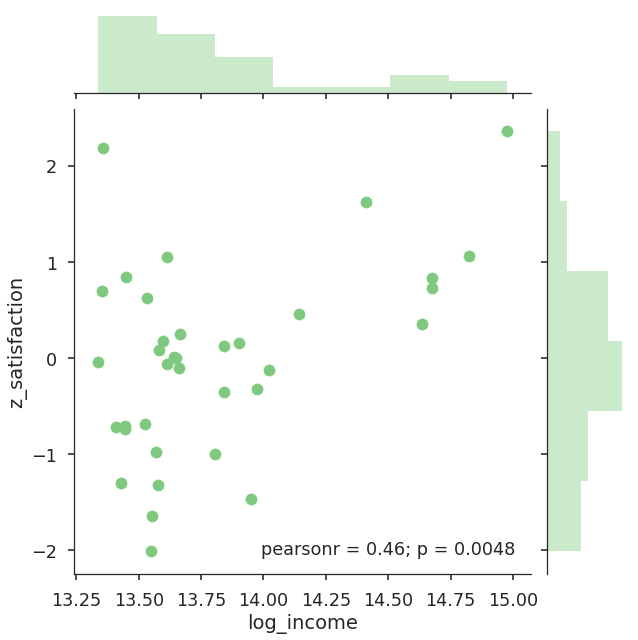

In [78]:
sns.jointplot('log_income', 'z_satisfaction', urban_municipalities, size=9)

Efectivamente hay una correlación alta y significativa ($\rho = 0.51$ no logarítmica, $\rho = 0.46$ con escala logarítmica de ingreso). ¿Qué otros análisis similares podemos hacer?